In [1]:
import json
import numpy as np
import pandas as pd

In [2]:
with open('../data/processed/split.json') as f:
    split = json.load(f)

In [3]:
data = pd.concat([pd.DataFrame(split['train']), pd.DataFrame(split['val']), pd.DataFrame(split['test'])])

In [4]:
data

,patientid,study,x,y
0,10348,st000,/mnt/netcache/bodyct/experiments/covid19-prepr...,2
1,10619,st000,/mnt/netcache/bodyct/experiments/covid19-prepr...,0
2,10320,st000,/mnt/netcache/bodyct/experiments/covid19-prepr...,0
3,10320,st001,/mnt/netcache/bodyct/experiments/covid19-prepr...,0
4,10525,st000,/mnt/netcache/bodyct/experiments/covid19-prepr...,0
...,...,...,...,...
114,10184,st000,/mnt/netcache/bodyct/experiments/covid19-prepr...,1
115,10185,st000,/mnt/netcache/bodyct/experiments/covid19-prepr...,0
116,10186,st000,/mnt/netcache/bodyct/experiments/covid19-prepr...,0
117,10186,st001,/mnt/netcache/bodyct/experiments/covid19-prepr...,1


In [5]:
embeddings = pd.read_csv('lightly_outputs/2021-04-14/17-09-50/embeddings.csv')
embeddings

,filenames,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,...,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,labels
0,10000_st000_0_amax_0.tif,0.403423,0.217569,1.156030,0.856136,0.571371,0.130330,-0.171898,-0.663181,0.418417,...,0.913038,-0.338325,-2.025310,0.333058,1.000578,-1.166508,0.780580,0.489829,0.666829,0
1,10000_st000_0_amax_1.tif,0.334062,0.125034,1.342225,0.786652,0.623737,0.110833,-0.133822,-0.903707,0.461140,...,0.791222,-0.259432,-2.109078,0.352386,0.982365,-1.121314,0.882144,0.436551,0.446901,0
2,10000_st000_0_amax_10.tif,0.348666,-0.279686,1.519889,1.084577,0.729268,0.004762,0.205722,-0.332975,1.078166,...,1.084226,0.367558,-3.767300,0.945281,-0.169338,-0.970255,0.100153,1.226171,0.918660,0
3,10000_st000_0_amax_11.tif,-0.037341,-0.389149,2.469136,1.562487,0.248654,-0.264429,-0.550948,-0.642362,1.152999,...,1.100022,0.688802,-4.121410,0.991146,0.224633,-0.895854,0.188133,0.965396,0.342412,0
4,10000_st000_0_amax_12.tif,-0.095500,-0.465474,2.168582,1.334887,0.205404,-0.055247,-0.222534,-0.679837,0.882498,...,0.785401,0.603192,-3.950665,0.831797,0.026160,-0.573096,0.192834,1.199614,0.366188,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
302695,10910_st000_2_median_5.tif,1.206151,0.783334,0.672175,0.638916,-0.132355,-0.297787,0.265117,0.001563,0.982466,...,1.437736,-0.307083,-2.351409,1.773842,0.491875,-1.201412,0.181526,0.210791,0.094285,0
302696,10910_st000_2_median_6.tif,1.094205,0.675443,0.574909,0.516851,-0.033450,-0.095404,0.463687,-0.105678,1.105573,...,1.374666,-0.248730,-2.314128,1.795935,0.380956,-0.963110,0.041219,0.455697,-0.055526,0
302697,10910_st000_2_median_7.tif,1.432893,0.588705,0.387260,0.896620,-0.162135,-0.134455,0.349855,0.041584,1.285978,...,1.737607,-0.088467,-2.590687,1.930748,0.187793,-0.961449,0.057967,0.429871,-0.270368,0
302698,10910_st000_2_median_8.tif,1.648680,0.929708,-0.043878,0.862475,-0.527015,-0.169298,0.512704,0.228307,1.128727,...,1.742887,0.033527,-2.136346,1.973467,0.063724,-0.727680,-0.413314,0.320678,-0.039532,0


In [6]:
embeddings.filenames = embeddings.filenames.str.replace('.tif', '')

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


In [7]:
embeddings[['patientid', 'study', 'axis', 'agg', 'slab_id']] = embeddings.filenames.str.split('_', expand=True)

In [8]:
embeddings.patientid = embeddings.patientid.astype(np.int64)

In [9]:
embedding_wide = pd.pivot(embeddings, index=['patientid', 'study'], columns=['axis', 'agg', 'slab_id'], values=[f'embedding_{i}' for i in range(32)])
embedding_wide.columns = [' '.join(col).strip() for col in embedding_wide.columns.values]

In [10]:
embedding_wide

embedding_0 0 amax 0  embedding_0 0 amax 1  \
patientid study                                               
10000     st000              0.403423              0.334062   
          st001              0.319752              0.155921   
10001     st000              0.219138              0.090922   
10002     st000              0.686287              0.478598   
10003     st000              0.353791              0.232851   
...                               ...                   ...   
10906     st000              0.304816              0.218467   
10907     st000              0.355863              0.125542   
10908     st000              0.638448              0.575012   
10909     st000              0.679402              0.618050   
10910     st000              0.298783              0.128452   

                 embedding_0 0 amax 10  embedding_0 0 amax 11  \
patientid study                                                 
10000     st000               0.348666              -0.037341   
          st001               0.570364               0.411269   
10001     st000               0.054435              -0.035709   
10002     st000               0.004325               0.312480   
10003     st000               0.094638               0.196685   
...                                ...                    ...   
10906     st000               0.106673               0.158184   
10907     st000              -0.021803              -0.146684   
10908     st000               0.153274               0.178291   
10909     st000               0.396894               0.445831   
10910     st000               0.098485              -0.022725   

                 embedding_0 0 amax 12  embedding_0 0 amax 13  \
patientid study                                                 
10000     st000              -0.095500               0.168551   
          st001               0.319499               0.097171   
10001     st000               0.021819              -0.136629   
10002     st000               0.323258               0.330678   
10003     st000               0.181327               0.099269   
...                                ...                    ...   
10906     st000               0.501219               0.657029   
10907     st000              -0.343994              -0.271843   
10908     st000               0.193842               0.157849   
10909     st000               0.574982               0.211225   
10910     st000               0.163476               0.360571   

                 embedding_0 0 amax 14  embedding_0 0 amax 15  \
patientid study                                                 
10000     st000               0.428689               0.470664   
          st001               0.473371               0.863580   
10001     st000              -0.209156              -0.084061   
10002     st000               0.193469              -0.049898   
10003     st000               0.305148               0.273103   
...                                ...                    ...   
10906     st000               0.305816               0.194565   
10907     st000              -0.236070              -0.021218   
10908     st000               0.221816              -0.100958   
10909     st000               0.147910               0.477046   
10910     st000               0.423264               0.508429   

                 embedding_0 0 amax 16  embedding_0 0 amax 17  ...  \
patientid study                                                ...   
10000     st000               0.140037               0.073544  ...   
          st001               0.866200               0.209262  ...   
10001     st000              -0.127753              -0.026772  ...   
10002     st000               0.059611               0.228473  ...   
10003     st000               0.098073               0.449977  ...   
...                                ...                    ...  ...   
10906     st000               0.180500               0.249077  ...   
10907     st000              

In [11]:
embedding_full = embedding_wide.merge(data, on=['patientid', 'study'])

In [12]:
from lightgbm.sklearn import LGBMRegressor

In [13]:
embedding_full

,patientid,study,embedding_0 0 amax 0,embedding_0 0 amax 1,embedding_0 0 amax 10,embedding_0 0 amax 11,embedding_0 0 amax 12,embedding_0 0 amax 13,embedding_0 0 amax 14,embedding_0 0 amax 15,...,embedding_31 2 median 24,embedding_31 2 median 3,embedding_31 2 median 4,embedding_31 2 median 5,embedding_31 2 median 6,embedding_31 2 median 7,embedding_31 2 median 8,embedding_31 2 median 9,x,y
0,10000,st000,0.403423,0.334062,0.348666,-0.037341,-0.095500,0.168551,0.428689,0.470664,...,0.792452,0.230974,0.117086,-0.287091,-0.387156,-0.444628,-0.127892,0.536918,/mnt/netcache/bodyct/experiments/covid19-prepr...,0
1,10000,st001,0.319752,0.155921,0.570364,0.411269,0.319499,0.097171,0.473371,0.863580,...,0.661364,0.089224,-0.025016,-0.048936,-0.200078,-0.222292,0.257547,0.688807,/mnt/netcache/bodyct/experiments/covid19-prepr...,0
2,10001,st000,0.219138,0.090922,0.054435,-0.035709,0.021819,-0.136629,-0.209156,-0.084061,...,0.692317,0.303039,0.306673,0.217111,0.114063,0.458297,0.778407,0.732412,/mnt/netcache/bodyct/experiments/covid19-prepr...,4
3,10002,st000,0.686287,0.478598,0.004325,0.312480,0.323258,0.330678,0.193469,-0.049898,...,1.006266,0.911056,0.341277,0.180599,-0.095310,0.179527,0.589749,0.711481,/mnt/netcache/bodyct/experiments/covid19-prepr...,2
4,10003,st000,0.353791,0.232851,0.094638,0.196685,0.181327,0.099269,0.305148,0.273103,...,1.170755,0.543951,0.313641,-0.211977,-0.015564,-0.135309,0.146170,0.562148,/mnt/netcache/bodyct/experiments/covid19-prepr...,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
796,10723,st000,0.355272,0.389835,0.001850,-0.071892,-0.183812,-0.373770,0.025014,-0.005480,...,0.982284,0.154476,0.050614,-0.086895,-0.262054,0.041652,0.554474,0.992962,/mnt/netcache/bodyct/experiments/covid19-prepr...,0
797,10724,st000,0.296459,0.292561,0.005979,-0.074884,0.294839,-0.120348,-0.352301,-0.258682,...,-0.159899,0.308370,0.042008,0.070767,-0.351501,-0.040581,-0.288364,0.350769,/mnt/netcache/bodyct/experiments/covid19-prepr...,1
798,10725,st000,0.485100,0.323802,0.085212,0.152660,0.160301,0.140489,0.269798,0.073055,...,0.770515,0.403087,0.282225,0.426661,0.494081,0.426372,0.539533,0.648432,/mnt/netcache/bodyct/experiments/covid19-prepr...,0
799,10726,st000,0.505839,0.488820,0.009515,0.234543,0.327504,0.026184,0.006455,0.142739,...,1.219598,0.984609,0.804535,0.522423,0.593673,0.131847,0.461557,0.425084,/mnt/netcache/bodyct/experiments/covid19-prepr...,0


In [14]:
LGBMRegressor(n_jobs=-1).fit(embedding_full.loc[:, embedding_full.columns.str.startswith('embedding_')], embedding_full['y'])

LGBMRegressor()

In [14]:
from lightgbm.sklearn import LGBMRegressor
from sklearn.metrics import make_scorer, accuracy_score, roc_auc_score
from sklearn.model_selection import cross_validate
from sklearn.pipeline import Pipeline
def thresh_accuracy(y, y_pred):
    y_thresh = np.round(y/5)
    y_pred_thresh = y_pred/5
    try:
        auc = roc_auc_score(y_thresh, y_pred_thresh)
    except:
        print('scoring failed')
        return 0.0
#     print(auc)
#     if np.isnan(auc):
#         print(y_thresh)
#         print(y_pred_thresh)
    return roc_auc_score(y_thresh, y_pred_thresh)

In [15]:
from sklearn.model_selection import RepeatedStratifiedKFold

In [206]:
cross_validate(LGBMRegressor(n_jobs=-1, boosting_type='dart'), embedding_full.loc[:, embedding_full.columns.str.contains('embedding')], embedding_full['y'], scoring=make_scorer(thresh_accuracy), cv=RepeatedStratifiedKFold(n_splits=5, n_repeats=2))['test_score'].mean()

0.843482519381326

In [16]:
train, validate, test = np.split(embedding_full.sample(frac=1), [int(.83*len(embedding_full)), int(.83*len(embedding_full))])

In [17]:
len(train)

664

In [19]:
reg = LGBMRegressor(n_jobs=-1, linear_tree=True)

In [191]:
reg.fit(train.loc[:, train.columns.str.contains('embedding')], train['y'], 
        eval_set=(validate.loc[:, validate.columns.str.contains('embedding')], validate['y']), early_stopping_rounds=20)

[LightGBM] [Warning] Unknown parameter: linear_tree
[1]	valid_0's l2: 2.39561
Training until validation scores don't improve for 20 rounds
[2]	valid_0's l2: 2.31651
[3]	valid_0's l2: 2.18789
[4]	valid_0's l2: 2.20695
[5]	valid_0's l2: 2.08481
[6]	valid_0's l2: 2.01702
[7]	valid_0's l2: 1.94073
[8]	valid_0's l2: 1.88889
[9]	valid_0's l2: 1.88316
[10]	valid_0's l2: 1.8468
[11]	valid_0's l2: 1.82433
[12]	valid_0's l2: 1.77591
[13]	valid_0's l2: 1.71391
[14]	valid_0's l2: 1.68004
[15]	valid_0's l2: 1.68441
[16]	valid_0's l2: 1.70492
[17]	valid_0's l2: 1.69665
[18]	valid_0's l2: 1.70078
[19]	valid_0's l2: 1.72065
[20]	valid_0's l2: 1.70115
[21]	valid_0's l2: 1.68922
[22]	valid_0's l2: 1.69749
[23]	valid_0's l2: 1.70591
[24]	valid_0's l2: 1.70776
[25]	valid_0's l2: 1.71157
[26]	valid_0's l2: 1.7041
[27]	valid_0's l2: 1.7108
[28]	valid_0's l2: 1.70351
[29]	valid_0's l2: 1.72354
[30]	valid_0's l2: 1.7073
[31]	valid_0's l2: 1.71347
[32]	valid_0's l2: 1.73932
[33]	valid_0's l2: 1.71691
[34]	vali

LGBMRegressor(linear_tree=True)

In [192]:
thresh_accuracy(test['y'], reg.predict(test.loc[:, test.columns.str.contains('embedding')]))

0.8655462184873949

In [203]:
scores = []
for i in range(50):
    train, validate, test = np.split(embedding_full.sample(frac=1), [int(.9*len(embedding_full)), int(.95*len(embedding_full))])
    reg = LGBMRegressor(n_jobs=-1, boosting_type='dart', num_leaves=10)
    reg.fit(train.loc[:, train.columns.str.contains('embedding')], train['y'], 
        eval_set=(validate.loc[:, validate.columns.str.contains('embedding')], validate['y']), early_stopping_rounds=20)
    score = thresh_accuracy(test['y'], reg.predict(test.loc[:, test.columns.str.contains('embedding')]))
    scores.append(score)

[1]	valid_0's l2: 2.85882
[2]	valid_0's l2: 2.79497
[3]	valid_0's l2: 2.68188
[4]	valid_0's l2: 2.59277
[5]	valid_0's l2: 2.5425
[6]	valid_0's l2: 2.50112
[7]	valid_0's l2: 2.49416
[8]	valid_0's l2: 2.50418
[9]	valid_0's l2: 2.47256
[10]	valid_0's l2: 2.44481
[11]	valid_0's l2: 2.4169
[12]	valid_0's l2: 2.4325
[13]	valid_0's l2: 2.41553
[14]	valid_0's l2: 2.41478
[15]	valid_0's l2: 2.44054
[16]	valid_0's l2: 2.4521
[17]	valid_0's l2: 2.44859
[18]	valid_0's l2: 2.50624
[19]	valid_0's l2: 2.50071
[20]	valid_0's l2: 2.51797
[21]	valid_0's l2: 2.50486
[22]	valid_0's l2: 2.51871
[23]	valid_0's l2: 2.5135
[24]	valid_0's l2: 2.49733
[25]	valid_0's l2: 2.48745
[26]	valid_0's l2: 2.50766
[27]	valid_0's l2: 2.51373
[28]	valid_0's l2: 2.5198
[29]	valid_0's l2: 2.53942
[30]	valid_0's l2: 2.52088
[31]	valid_0's l2: 2.50762
[32]	valid_0's l2: 2.49168
[33]	valid_0's l2: 2.47162
[34]	valid_0's l2: 2.43165
[35]	valid_0's l2: 2.42447
[36]	valid_0's l2: 2.43125
[37]	valid_0's l2: 2.43804
[38]	valid_0's l

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[30]	valid_0's l2: 1.90619
[31]	valid_0's l2: 1.91013
[32]	valid_0's l2: 1.9445
[33]	valid_0's l2: 1.91614
[34]	valid_0's l2: 1.87795
[35]	valid_0's l2: 1.88643
[36]	valid_0's l2: 1.90119
[37]	valid_0's l2: 1.88713
[38]	valid_0's l2: 1.89873
[39]	valid_0's l2: 1.89986
[40]	valid_0's l2: 1.90383
[41]	valid_0's l2: 1.88931
[42]	valid_0's l2: 1.91537
[43]	valid_0's l2: 1.91276
[44]	valid_0's l2: 1.89293
[45]	valid_0's l2: 1.89064
[46]	valid_0's l2: 2.02709
[47]	valid_0's l2: 2.03988
[48]	valid_0's l2: 2.03303
[49]	valid_0's l2: 2.04942
[50]	valid_0's l2: 2.04779
[51]	valid_0's l2: 2.06419
[52]	valid_0's l2: 2.02978
[53]	valid_0's l2: 2.02886
[54]	valid_0's l2: 2.00949
[55]	valid_0's l2: 2.0192
[56]	valid_0's l2: 2.03309
[57]	valid_0's l2: 2.05052
[58]	valid_0's l2: 2.197
[59]	valid_0's l2: 2.20885
[60]	valid_0's l2: 2.16728
[61]	valid_0's l2: 2.32593
[62]	valid_0's l2: 2.28453
[63]	valid_0's l2: 2.24569
[64]	valid_0's l2: 2.2426
[65]	valid_0's l2: 2.24396
[66]	valid_0's l2: 2.20371
[67]	

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[73]	valid_0's l2: 1.77381
[74]	valid_0's l2: 1.7751
[75]	valid_0's l2: 1.78316
[76]	valid_0's l2: 1.7924
[77]	valid_0's l2: 1.78853
[78]	valid_0's l2: 1.78775
[79]	valid_0's l2: 1.81347
[80]	valid_0's l2: 1.82189
[81]	valid_0's l2: 1.82406
[82]	valid_0's l2: 1.7946
[83]	valid_0's l2: 1.79405
[84]	valid_0's l2: 1.79521
[85]	valid_0's l2: 1.79381
[86]	valid_0's l2: 1.80593
[87]	valid_0's l2: 1.82791
[88]	valid_0's l2: 1.82236
[89]	valid_0's l2: 1.81906
[90]	valid_0's l2: 1.81652
[91]	valid_0's l2: 1.81641
[92]	valid_0's l2: 1.81479
[93]	valid_0's l2: 1.83208
[94]	valid_0's l2: 1.82249
[95]	valid_0's l2: 1.8187
[96]	valid_0's l2: 1.81669
[97]	valid_0's l2: 1.82158
[98]	valid_0's l2: 1.81951
[99]	valid_0's l2: 1.82184
[100]	valid_0's l2: 1.81669
[1]	valid_0's l2: 2.01102
[2]	valid_0's l2: 1.89051
[3]	valid_0's l2: 1.81285
[4]	valid_0's l2: 1.71668
[5]	valid_0's l2: 1.66797
[6]	valid_0's l2: 1.61564
[7]	valid_0's l2: 1.57804
[8]	valid_0's l2: 1.60668
[9]	valid_0's l2: 1.56987
[10]	valid_0

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')


[33]	valid_0's l2: 1.50017
[34]	valid_0's l2: 1.47535
[35]	valid_0's l2: 1.476
[36]	valid_0's l2: 1.49638
[37]	valid_0's l2: 1.47594
[38]	valid_0's l2: 1.50205
[39]	valid_0's l2: 1.51004
[40]	valid_0's l2: 1.51102
[41]	valid_0's l2: 1.50772
[42]	valid_0's l2: 1.5007
[43]	valid_0's l2: 1.50857
[44]	valid_0's l2: 1.49823
[45]	valid_0's l2: 1.48508
[46]	valid_0's l2: 1.53635
[47]	valid_0's l2: 1.51697
[48]	valid_0's l2: 1.53016
[49]	valid_0's l2: 1.53867
[50]	valid_0's l2: 1.54537
[51]	valid_0's l2: 1.53323
[52]	valid_0's l2: 1.51763
[53]	valid_0's l2: 1.52685
[54]	valid_0's l2: 1.52731
[55]	valid_0's l2: 1.52826
[56]	valid_0's l2: 1.54011
[57]	valid_0's l2: 1.53681
[58]	valid_0's l2: 1.60808
[59]	valid_0's l2: 1.61707
[60]	valid_0's l2: 1.61078
[61]	valid_0's l2: 1.70873
[62]	valid_0's l2: 1.65589
[63]	valid_0's l2: 1.64629
[64]	valid_0's l2: 1.65009
[65]	valid_0's l2: 1.6436
[66]	valid_0's l2: 1.61505
[67]	valid_0's l2: 1.60684
[68]	valid_0's l2: 1.59737
[69]	valid_0's l2: 1.60401
[70]	

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[74]	valid_0's l2: 2.43362
[75]	valid_0's l2: 2.41211
[76]	valid_0's l2: 2.40926
[77]	valid_0's l2: 2.4043
[78]	valid_0's l2: 2.40362
[79]	valid_0's l2: 2.39078
[80]	valid_0's l2: 2.38131
[81]	valid_0's l2: 2.38095
[82]	valid_0's l2: 2.35453
[83]	valid_0's l2: 2.35586
[84]	valid_0's l2: 2.35243
[85]	valid_0's l2: 2.35562
[86]	valid_0's l2: 2.3425
[87]	valid_0's l2: 2.34704
[88]	valid_0's l2: 2.34519
[89]	valid_0's l2: 2.34155
[90]	valid_0's l2: 2.34753
[91]	valid_0's l2: 2.42623
[92]	valid_0's l2: 2.40934
[93]	valid_0's l2: 2.38201
[94]	valid_0's l2: 2.38973
[95]	valid_0's l2: 2.3877
[96]	valid_0's l2: 2.3884
[97]	valid_0's l2: 2.36861
[98]	valid_0's l2: 2.36095
[99]	valid_0's l2: 2.36188
[100]	valid_0's l2: 2.33537
[1]	valid_0's l2: 2.0943
[2]	valid_0's l2: 2.03041
[3]	valid_0's l2: 2.02471
[4]	valid_0's l2: 2.01287
[5]	valid_0's l2: 1.99262
[6]	valid_0's l2: 2.00887
[7]	valid_0's l2: 1.99565
[8]	valid_0's l2: 1.98959
[9]	valid_0's l2: 1.94998
[10]	valid_0's l2: 1.93657
[11]	valid_0'

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[15]	valid_0's l2: 1.55449
[16]	valid_0's l2: 1.57598
[17]	valid_0's l2: 1.56056
[18]	valid_0's l2: 1.55474
[19]	valid_0's l2: 1.55004
[20]	valid_0's l2: 1.55464
[21]	valid_0's l2: 1.54875
[22]	valid_0's l2: 1.53737
[23]	valid_0's l2: 1.50678
[24]	valid_0's l2: 1.48709
[25]	valid_0's l2: 1.48168
[26]	valid_0's l2: 1.46628
[27]	valid_0's l2: 1.45565
[28]	valid_0's l2: 1.45512
[29]	valid_0's l2: 1.46268
[30]	valid_0's l2: 1.46348
[31]	valid_0's l2: 1.46217
[32]	valid_0's l2: 1.44368
[33]	valid_0's l2: 1.43753
[34]	valid_0's l2: 1.44853
[35]	valid_0's l2: 1.44407
[36]	valid_0's l2: 1.45748
[37]	valid_0's l2: 1.47988
[38]	valid_0's l2: 1.48914
[39]	valid_0's l2: 1.49597
[40]	valid_0's l2: 1.49135
[41]	valid_0's l2: 1.49227
[42]	valid_0's l2: 1.49036
[43]	valid_0's l2: 1.49209
[44]	valid_0's l2: 1.51863
[45]	valid_0's l2: 1.51552
[46]	valid_0's l2: 1.52955
[47]	valid_0's l2: 1.53357
[48]	valid_0's l2: 1.51479
[49]	valid_0's l2: 1.5124
[50]	valid_0's l2: 1.51037
[51]	valid_0's l2: 1.52352
[

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[33]	valid_0's l2: 1.72599
[34]	valid_0's l2: 1.72426
[35]	valid_0's l2: 1.72733
[36]	valid_0's l2: 1.72988
[37]	valid_0's l2: 1.7292
[38]	valid_0's l2: 1.72996
[39]	valid_0's l2: 1.70965
[40]	valid_0's l2: 1.70686
[41]	valid_0's l2: 1.71805
[42]	valid_0's l2: 1.71805
[43]	valid_0's l2: 1.71737
[44]	valid_0's l2: 1.71623
[45]	valid_0's l2: 1.70919
[46]	valid_0's l2: 1.76684
[47]	valid_0's l2: 1.75496
[48]	valid_0's l2: 1.73653
[49]	valid_0's l2: 1.73816
[50]	valid_0's l2: 1.73812
[51]	valid_0's l2: 1.73194
[52]	valid_0's l2: 1.71804
[53]	valid_0's l2: 1.72444
[54]	valid_0's l2: 1.70821
[55]	valid_0's l2: 1.70414
[56]	valid_0's l2: 1.70901
[57]	valid_0's l2: 1.6986
[58]	valid_0's l2: 1.78501
[59]	valid_0's l2: 1.78711
[60]	valid_0's l2: 1.76065
[61]	valid_0's l2: 1.86835
[62]	valid_0's l2: 1.82669
[63]	valid_0's l2: 1.8034
[64]	valid_0's l2: 1.80134
[65]	valid_0's l2: 1.80629
[66]	valid_0's l2: 1.78235
[67]	valid_0's l2: 1.77012
[68]	valid_0's l2: 1.74906
[69]	valid_0's l2: 1.75233
[70

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[98]	valid_0's l2: 2.72797
[99]	valid_0's l2: 2.70276
[100]	valid_0's l2: 2.67314
[1]	valid_0's l2: 2.06049
[2]	valid_0's l2: 1.96971
[3]	valid_0's l2: 1.9107
[4]	valid_0's l2: 1.86465
[5]	valid_0's l2: 1.81813
[6]	valid_0's l2: 1.79007
[7]	valid_0's l2: 1.75763
[8]	valid_0's l2: 1.77499
[9]	valid_0's l2: 1.71954
[10]	valid_0's l2: 1.69507
[11]	valid_0's l2: 1.68775
[12]	valid_0's l2: 1.68618
[13]	valid_0's l2: 1.68935
[14]	valid_0's l2: 1.66219
[15]	valid_0's l2: 1.62669
[16]	valid_0's l2: 1.63281
[17]	valid_0's l2: 1.59311
[18]	valid_0's l2: 1.59801
[19]	valid_0's l2: 1.60629
[20]	valid_0's l2: 1.60228
[21]	valid_0's l2: 1.6053
[22]	valid_0's l2: 1.55362
[23]	valid_0's l2: 1.53975
[24]	valid_0's l2: 1.51385
[25]	valid_0's l2: 1.50603
[26]	valid_0's l2: 1.50085
[27]	valid_0's l2: 1.48935
[28]	valid_0's l2: 1.49444
[29]	valid_0's l2: 1.46746
[30]	valid_0's l2: 1.44237
[31]	valid_0's l2: 1.43683
[32]	valid_0's l2: 1.44241
[33]	valid_0's l2: 1.44642
[34]	valid_0's l2: 1.43648
[35]	valid

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[40]	valid_0's l2: 1.80794
[41]	valid_0's l2: 1.81315
[42]	valid_0's l2: 1.75761
[43]	valid_0's l2: 1.76645
[44]	valid_0's l2: 1.7628
[45]	valid_0's l2: 1.75192
[46]	valid_0's l2: 1.85228
[47]	valid_0's l2: 1.81519
[48]	valid_0's l2: 1.81695
[49]	valid_0's l2: 1.82429
[50]	valid_0's l2: 1.83648
[51]	valid_0's l2: 1.82705
[52]	valid_0's l2: 1.83056
[53]	valid_0's l2: 1.84672
[54]	valid_0's l2: 1.82461
[55]	valid_0's l2: 1.8013
[56]	valid_0's l2: 1.81645
[57]	valid_0's l2: 1.80626
[58]	valid_0's l2: 1.927
[59]	valid_0's l2: 1.94234
[60]	valid_0's l2: 1.91559
[61]	valid_0's l2: 2.05143
[62]	valid_0's l2: 1.99442
[63]	valid_0's l2: 1.96608
[64]	valid_0's l2: 1.96773
[65]	valid_0's l2: 1.97282
[66]	valid_0's l2: 1.93737
[67]	valid_0's l2: 1.92333
[68]	valid_0's l2: 1.89509
[69]	valid_0's l2: 1.90904
[70]	valid_0's l2: 1.9108
[71]	valid_0's l2: 1.91728
[72]	valid_0's l2: 1.90706
[73]	valid_0's l2: 1.88961
[74]	valid_0's l2: 1.89811
[75]	valid_0's l2: 1.86897
[76]	valid_0's l2: 1.87145
[77]	

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[66]	valid_0's l2: 2.24713
[67]	valid_0's l2: 2.22635
[68]	valid_0's l2: 2.22277
[69]	valid_0's l2: 2.23136
[70]	valid_0's l2: 2.22411
[71]	valid_0's l2: 2.21999
[72]	valid_0's l2: 2.18576
[73]	valid_0's l2: 2.15288
[74]	valid_0's l2: 2.15417
[75]	valid_0's l2: 2.15133
[76]	valid_0's l2: 2.14986
[77]	valid_0's l2: 2.15364
[78]	valid_0's l2: 2.15766
[79]	valid_0's l2: 2.14236
[80]	valid_0's l2: 2.13139
[81]	valid_0's l2: 2.13565
[82]	valid_0's l2: 2.14668
[83]	valid_0's l2: 2.14832
[84]	valid_0's l2: 2.15284
[85]	valid_0's l2: 2.15647
[86]	valid_0's l2: 2.14544
[87]	valid_0's l2: 2.12755
[88]	valid_0's l2: 2.13688
[89]	valid_0's l2: 2.13972
[90]	valid_0's l2: 2.14027
[91]	valid_0's l2: 2.19692
[92]	valid_0's l2: 2.1691
[93]	valid_0's l2: 2.14475
[94]	valid_0's l2: 2.15364
[95]	valid_0's l2: 2.15959
[96]	valid_0's l2: 2.164
[97]	valid_0's l2: 2.16599
[98]	valid_0's l2: 2.17198
[99]	valid_0's l2: 2.17271
[100]	valid_0's l2: 2.15373
[1]	valid_0's l2: 2.07193
[2]	valid_0's l2: 2.00887
[3]	

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[25]	valid_0's l2: 1.70758
[26]	valid_0's l2: 1.72427
[27]	valid_0's l2: 1.72115
[28]	valid_0's l2: 1.71686
[29]	valid_0's l2: 1.73306
[30]	valid_0's l2: 1.75079
[31]	valid_0's l2: 1.7416
[32]	valid_0's l2: 1.76758
[33]	valid_0's l2: 1.80875
[34]	valid_0's l2: 1.79999
[35]	valid_0's l2: 1.79808
[36]	valid_0's l2: 1.78824
[37]	valid_0's l2: 1.78334
[38]	valid_0's l2: 1.75704
[39]	valid_0's l2: 1.73863
[40]	valid_0's l2: 1.74132
[41]	valid_0's l2: 1.74218
[42]	valid_0's l2: 1.73222
[43]	valid_0's l2: 1.73153
[44]	valid_0's l2: 1.75231
[45]	valid_0's l2: 1.75489
[46]	valid_0's l2: 1.79525
[47]	valid_0's l2: 1.79785
[48]	valid_0's l2: 1.78365
[49]	valid_0's l2: 1.78023
[50]	valid_0's l2: 1.77736
[51]	valid_0's l2: 1.78807
[52]	valid_0's l2: 1.78904
[53]	valid_0's l2: 1.79256
[54]	valid_0's l2: 1.7882
[55]	valid_0's l2: 1.7779
[56]	valid_0's l2: 1.7731
[57]	valid_0's l2: 1.75951
[58]	valid_0's l2: 1.8292
[59]	valid_0's l2: 1.82313
[60]	valid_0's l2: 1.81688
[61]	valid_0's l2: 1.90441
[62]	

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[2]	valid_0's l2: 2.50897
[3]	valid_0's l2: 2.49176
[4]	valid_0's l2: 2.44502
[5]	valid_0's l2: 2.43872
[6]	valid_0's l2: 2.37665
[7]	valid_0's l2: 2.34029
[8]	valid_0's l2: 2.3641
[9]	valid_0's l2: 2.38614
[10]	valid_0's l2: 2.33803
[11]	valid_0's l2: 2.34107
[12]	valid_0's l2: 2.33765
[13]	valid_0's l2: 2.35126
[14]	valid_0's l2: 2.33775
[15]	valid_0's l2: 2.3728
[16]	valid_0's l2: 2.38379
[17]	valid_0's l2: 2.41603
[18]	valid_0's l2: 2.42603
[19]	valid_0's l2: 2.3923
[20]	valid_0's l2: 2.39278
[21]	valid_0's l2: 2.38422
[22]	valid_0's l2: 2.37635
[23]	valid_0's l2: 2.40601
[24]	valid_0's l2: 2.41798
[25]	valid_0's l2: 2.44837
[26]	valid_0's l2: 2.45255
[27]	valid_0's l2: 2.45816
[28]	valid_0's l2: 2.44045
[29]	valid_0's l2: 2.46141
[30]	valid_0's l2: 2.47233
[31]	valid_0's l2: 2.45061
[32]	valid_0's l2: 2.44089
[33]	valid_0's l2: 2.45223
[34]	valid_0's l2: 2.43262
[35]	valid_0's l2: 2.42307
[36]	valid_0's l2: 2.4088
[37]	valid_0's l2: 2.43131
[38]	valid_0's l2: 2.44265
[39]	valid_0

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[84]	valid_0's l2: 2.20801
[85]	valid_0's l2: 2.21043
[86]	valid_0's l2: 2.2263
[87]	valid_0's l2: 2.22902
[88]	valid_0's l2: 2.22366
[89]	valid_0's l2: 2.22092
[90]	valid_0's l2: 2.22175
[91]	valid_0's l2: 2.22791
[92]	valid_0's l2: 2.23014
[93]	valid_0's l2: 2.23989
[94]	valid_0's l2: 2.23175
[95]	valid_0's l2: 2.22908
[96]	valid_0's l2: 2.2292
[97]	valid_0's l2: 2.19987
[98]	valid_0's l2: 2.19572
[99]	valid_0's l2: 2.2106
[100]	valid_0's l2: 2.20866
[1]	valid_0's l2: 2.36205
[2]	valid_0's l2: 2.20449
[3]	valid_0's l2: 2.11253
[4]	valid_0's l2: 2.00522
[5]	valid_0's l2: 1.92781
[6]	valid_0's l2: 1.85213
[7]	valid_0's l2: 1.77538
[8]	valid_0's l2: 1.8113
[9]	valid_0's l2: 1.75023
[10]	valid_0's l2: 1.69723
[11]	valid_0's l2: 1.67098
[12]	valid_0's l2: 1.6807
[13]	valid_0's l2: 1.64415
[14]	valid_0's l2: 1.62508
[15]	valid_0's l2: 1.5808
[16]	valid_0's l2: 1.55383
[17]	valid_0's l2: 1.53188
[18]	valid_0's l2: 1.48945
[19]	valid_0's l2: 1.50538
[20]	valid_0's l2: 1.49487
[21]	valid_0's

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[49]	valid_0's l2: 2.4091
[50]	valid_0's l2: 2.39802
[51]	valid_0's l2: 2.36393
[52]	valid_0's l2: 2.37757
[53]	valid_0's l2: 2.37704
[54]	valid_0's l2: 2.35994
[55]	valid_0's l2: 2.36953
[56]	valid_0's l2: 2.37082
[57]	valid_0's l2: 2.39197
[58]	valid_0's l2: 2.43741
[59]	valid_0's l2: 2.43615
[60]	valid_0's l2: 2.40752
[61]	valid_0's l2: 2.48473
[62]	valid_0's l2: 2.48239
[63]	valid_0's l2: 2.43872
[64]	valid_0's l2: 2.42536
[65]	valid_0's l2: 2.42394
[66]	valid_0's l2: 2.43076
[67]	valid_0's l2: 2.42135
[68]	valid_0's l2: 2.41678
[69]	valid_0's l2: 2.40787
[70]	valid_0's l2: 2.39967
[71]	valid_0's l2: 2.39119
[72]	valid_0's l2: 2.38232
[73]	valid_0's l2: 2.3573
[74]	valid_0's l2: 2.36172
[75]	valid_0's l2: 2.37174
[76]	valid_0's l2: 2.37126
[77]	valid_0's l2: 2.36119
[78]	valid_0's l2: 2.36078
[79]	valid_0's l2: 2.3344
[80]	valid_0's l2: 2.3247
[81]	valid_0's l2: 2.32638
[82]	valid_0's l2: 2.33406
[83]	valid_0's l2: 2.33174
[84]	valid_0's l2: 2.32711
[85]	valid_0's l2: 2.32643
[86]

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[80]	valid_0's l2: 1.2609
[81]	valid_0's l2: 1.26788
[82]	valid_0's l2: 1.26607
[83]	valid_0's l2: 1.26387
[84]	valid_0's l2: 1.26401
[85]	valid_0's l2: 1.26732
[86]	valid_0's l2: 1.24331
[87]	valid_0's l2: 1.23051
[88]	valid_0's l2: 1.23123
[89]	valid_0's l2: 1.23309
[90]	valid_0's l2: 1.23515
[91]	valid_0's l2: 1.29172
[92]	valid_0's l2: 1.27096
[93]	valid_0's l2: 1.22418
[94]	valid_0's l2: 1.231
[95]	valid_0's l2: 1.23651
[96]	valid_0's l2: 1.24169
[97]	valid_0's l2: 1.24191
[98]	valid_0's l2: 1.24671
[99]	valid_0's l2: 1.21672
[100]	valid_0's l2: 1.20753
[1]	valid_0's l2: 2.27287
[2]	valid_0's l2: 2.19232
[3]	valid_0's l2: 2.13933
[4]	valid_0's l2: 2.0695
[5]	valid_0's l2: 2.03238
[6]	valid_0's l2: 1.96852
[7]	valid_0's l2: 1.9589
[8]	valid_0's l2: 1.97931
[9]	valid_0's l2: 1.92991
[10]	valid_0's l2: 1.90287
[11]	valid_0's l2: 1.87299
[12]	valid_0's l2: 1.87088
[13]	valid_0's l2: 1.84725
[14]	valid_0's l2: 1.85562
[15]	valid_0's l2: 1.84843
[16]	valid_0's l2: 1.81886
[17]	valid_0'

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')


[37]	valid_0's l2: 2.11416
[38]	valid_0's l2: 2.08677
[39]	valid_0's l2: 2.11438
[40]	valid_0's l2: 2.14091
[41]	valid_0's l2: 2.15571
[42]	valid_0's l2: 2.14393
[43]	valid_0's l2: 2.15416
[44]	valid_0's l2: 2.16844
[45]	valid_0's l2: 2.13754
[46]	valid_0's l2: 2.21924
[47]	valid_0's l2: 2.23047
[48]	valid_0's l2: 2.23104
[49]	valid_0's l2: 2.22948
[50]	valid_0's l2: 2.22399
[51]	valid_0's l2: 2.19101
[52]	valid_0's l2: 2.19066
[53]	valid_0's l2: 2.19144
[54]	valid_0's l2: 2.18556
[55]	valid_0's l2: 2.18797
[56]	valid_0's l2: 2.18554
[57]	valid_0's l2: 2.19302
[58]	valid_0's l2: 2.30311
[59]	valid_0's l2: 2.30669
[60]	valid_0's l2: 2.28114
[61]	valid_0's l2: 2.40442
[62]	valid_0's l2: 2.37352
[63]	valid_0's l2: 2.36419
[64]	valid_0's l2: 2.37002
[65]	valid_0's l2: 2.36774
[66]	valid_0's l2: 2.3139
[67]	valid_0's l2: 2.29575
[68]	valid_0's l2: 2.25912
[69]	valid_0's l2: 2.25327
[70]	valid_0's l2: 2.25043
[71]	valid_0's l2: 2.25695
[72]	valid_0's l2: 2.25558
[73]	valid_0's l2: 2.26131
[7

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[2]	valid_0's l2: 1.76733
[3]	valid_0's l2: 1.72621
[4]	valid_0's l2: 1.70816
[5]	valid_0's l2: 1.70313
[6]	valid_0's l2: 1.6876
[7]	valid_0's l2: 1.68827
[8]	valid_0's l2: 1.68901
[9]	valid_0's l2: 1.66477
[10]	valid_0's l2: 1.6753
[11]	valid_0's l2: 1.66922
[12]	valid_0's l2: 1.66953
[13]	valid_0's l2: 1.6661
[14]	valid_0's l2: 1.66644
[15]	valid_0's l2: 1.64862
[16]	valid_0's l2: 1.62295
[17]	valid_0's l2: 1.64409
[18]	valid_0's l2: 1.64903
[19]	valid_0's l2: 1.62822
[20]	valid_0's l2: 1.62478
[21]	valid_0's l2: 1.61926
[22]	valid_0's l2: 1.60685
[23]	valid_0's l2: 1.59637
[24]	valid_0's l2: 1.59694
[25]	valid_0's l2: 1.6175
[26]	valid_0's l2: 1.60587
[27]	valid_0's l2: 1.59161
[28]	valid_0's l2: 1.59174
[29]	valid_0's l2: 1.60447
[30]	valid_0's l2: 1.62084
[31]	valid_0's l2: 1.62224
[32]	valid_0's l2: 1.6389
[33]	valid_0's l2: 1.64291
[34]	valid_0's l2: 1.66449
[35]	valid_0's l2: 1.66016
[36]	valid_0's l2: 1.64836
[37]	valid_0's l2: 1.63599
[38]	valid_0's l2: 1.63626
[39]	valid_0'

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[73]	valid_0's l2: 2.14135
[74]	valid_0's l2: 2.14317
[75]	valid_0's l2: 2.16656
[76]	valid_0's l2: 2.16675
[77]	valid_0's l2: 2.17214
[78]	valid_0's l2: 2.18235
[79]	valid_0's l2: 2.17032
[80]	valid_0's l2: 2.19192
[81]	valid_0's l2: 2.19492
[82]	valid_0's l2: 2.16053
[83]	valid_0's l2: 2.16323
[84]	valid_0's l2: 2.16235
[85]	valid_0's l2: 2.16601
[86]	valid_0's l2: 2.17998
[87]	valid_0's l2: 2.17712
[88]	valid_0's l2: 2.1796
[89]	valid_0's l2: 2.17352
[90]	valid_0's l2: 2.17392
[91]	valid_0's l2: 2.22351
[92]	valid_0's l2: 2.203
[93]	valid_0's l2: 2.17668
[94]	valid_0's l2: 2.18298
[95]	valid_0's l2: 2.18553
[96]	valid_0's l2: 2.18968
[97]	valid_0's l2: 2.17976
[98]	valid_0's l2: 2.18336
[99]	valid_0's l2: 2.16976
[100]	valid_0's l2: 2.16498
[1]	valid_0's l2: 2.06033
[2]	valid_0's l2: 2.01072
[3]	valid_0's l2: 1.96297
[4]	valid_0's l2: 1.9174
[5]	valid_0's l2: 1.89073
[6]	valid_0's l2: 1.86117
[7]	valid_0's l2: 1.84261
[8]	valid_0's l2: 1.85364
[9]	valid_0's l2: 1.85415
[10]	valid_0

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')


[19]	valid_0's l2: 2.15044
[20]	valid_0's l2: 2.14519
[21]	valid_0's l2: 2.15953
[22]	valid_0's l2: 2.15244
[23]	valid_0's l2: 2.13456
[24]	valid_0's l2: 2.14898
[25]	valid_0's l2: 2.12518
[26]	valid_0's l2: 2.13524
[27]	valid_0's l2: 2.14885
[28]	valid_0's l2: 2.15937
[29]	valid_0's l2: 2.16584
[30]	valid_0's l2: 2.17896
[31]	valid_0's l2: 2.18184
[32]	valid_0's l2: 2.18569
[33]	valid_0's l2: 2.18049
[34]	valid_0's l2: 2.17989
[35]	valid_0's l2: 2.18836
[36]	valid_0's l2: 2.19713
[37]	valid_0's l2: 2.18665
[38]	valid_0's l2: 2.17154
[39]	valid_0's l2: 2.16145
[40]	valid_0's l2: 2.16582
[41]	valid_0's l2: 2.16625
[42]	valid_0's l2: 2.17897
[43]	valid_0's l2: 2.18658
[44]	valid_0's l2: 2.18246
[45]	valid_0's l2: 2.19723
[46]	valid_0's l2: 2.40092
[47]	valid_0's l2: 2.37221
[48]	valid_0's l2: 2.37186
[49]	valid_0's l2: 2.35405
[50]	valid_0's l2: 2.36679
[51]	valid_0's l2: 2.35212
[52]	valid_0's l2: 2.35351
[53]	valid_0's l2: 2.36721
[54]	valid_0's l2: 2.34074
[55]	valid_0's l2: 2.3083
[5

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[57]	valid_0's l2: 1.50421
[58]	valid_0's l2: 1.50756
[59]	valid_0's l2: 1.51034
[60]	valid_0's l2: 1.51234
[61]	valid_0's l2: 1.55571
[62]	valid_0's l2: 1.52928
[63]	valid_0's l2: 1.53503
[64]	valid_0's l2: 1.53436
[65]	valid_0's l2: 1.53474
[66]	valid_0's l2: 1.52533
[67]	valid_0's l2: 1.50249
[68]	valid_0's l2: 1.50415
[69]	valid_0's l2: 1.50753
[70]	valid_0's l2: 1.50954
[71]	valid_0's l2: 1.50794
[72]	valid_0's l2: 1.50906
[73]	valid_0's l2: 1.50509
[74]	valid_0's l2: 1.50902
[75]	valid_0's l2: 1.50256
[76]	valid_0's l2: 1.49823
[77]	valid_0's l2: 1.50204
[78]	valid_0's l2: 1.50131
[79]	valid_0's l2: 1.51732
[80]	valid_0's l2: 1.50182
[81]	valid_0's l2: 1.50189
[82]	valid_0's l2: 1.4941
[83]	valid_0's l2: 1.49206
[84]	valid_0's l2: 1.48705
[85]	valid_0's l2: 1.49036
[86]	valid_0's l2: 1.48627
[87]	valid_0's l2: 1.48461
[88]	valid_0's l2: 1.48577
[89]	valid_0's l2: 1.4899
[90]	valid_0's l2: 1.48864
[91]	valid_0's l2: 1.49267
[92]	valid_0's l2: 1.46495
[93]	valid_0's l2: 1.4688
[94

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[13]	valid_0's l2: 2.22753
[14]	valid_0's l2: 2.23738
[15]	valid_0's l2: 2.23879
[16]	valid_0's l2: 2.27126
[17]	valid_0's l2: 2.27699
[18]	valid_0's l2: 2.26643
[19]	valid_0's l2: 2.28839
[20]	valid_0's l2: 2.25023
[21]	valid_0's l2: 2.257
[22]	valid_0's l2: 2.24047
[23]	valid_0's l2: 2.20589
[24]	valid_0's l2: 2.19391
[25]	valid_0's l2: 2.17849
[26]	valid_0's l2: 2.18174
[27]	valid_0's l2: 2.18983
[28]	valid_0's l2: 2.1897
[29]	valid_0's l2: 2.16805
[30]	valid_0's l2: 2.18863
[31]	valid_0's l2: 2.16529
[32]	valid_0's l2: 2.15017
[33]	valid_0's l2: 2.13396
[34]	valid_0's l2: 2.15386
[35]	valid_0's l2: 2.15464
[36]	valid_0's l2: 2.14867
[37]	valid_0's l2: 2.1284
[38]	valid_0's l2: 2.12142
[39]	valid_0's l2: 2.12375
[40]	valid_0's l2: 2.1287
[41]	valid_0's l2: 2.12205
[42]	valid_0's l2: 2.12459
[43]	valid_0's l2: 2.12667
[44]	valid_0's l2: 2.09847
[45]	valid_0's l2: 2.1047
[46]	valid_0's l2: 2.04015
[47]	valid_0's l2: 2.05604
[48]	valid_0's l2: 2.0527
[49]	valid_0's l2: 2.05914
[50]	va

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[2]	valid_0's l2: 2.13776
[3]	valid_0's l2: 2.08832
[4]	valid_0's l2: 2.08357
[5]	valid_0's l2: 2.07398
[6]	valid_0's l2: 2.07087
[7]	valid_0's l2: 2.07283
[8]	valid_0's l2: 2.07389
[9]	valid_0's l2: 2.04977
[10]	valid_0's l2: 2.0401
[11]	valid_0's l2: 2.05884
[12]	valid_0's l2: 2.0654
[13]	valid_0's l2: 2.06588
[14]	valid_0's l2: 2.07067
[15]	valid_0's l2: 2.05242
[16]	valid_0's l2: 2.04545
[17]	valid_0's l2: 2.01952
[18]	valid_0's l2: 1.99157
[19]	valid_0's l2: 1.99132
[20]	valid_0's l2: 1.98173
[21]	valid_0's l2: 1.99277
[22]	valid_0's l2: 1.97571
[23]	valid_0's l2: 1.96234
[24]	valid_0's l2: 1.96309
[25]	valid_0's l2: 1.97626
[26]	valid_0's l2: 1.98763
[27]	valid_0's l2: 1.99894
[28]	valid_0's l2: 1.98639
[29]	valid_0's l2: 2.00335
[30]	valid_0's l2: 2.02703
[31]	valid_0's l2: 2.03964
[32]	valid_0's l2: 2.03219
[33]	valid_0's l2: 2.04149
[34]	valid_0's l2: 2.04956
[35]	valid_0's l2: 2.04755
[36]	valid_0's l2: 2.04744
[37]	valid_0's l2: 2.05029
[38]	valid_0's l2: 2.06662
[39]	valid

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[84]	valid_0's l2: 1.53456
[85]	valid_0's l2: 1.54074
[86]	valid_0's l2: 1.54788
[87]	valid_0's l2: 1.55418
[88]	valid_0's l2: 1.55653
[89]	valid_0's l2: 1.55965
[90]	valid_0's l2: 1.5561
[91]	valid_0's l2: 1.51867
[92]	valid_0's l2: 1.54127
[93]	valid_0's l2: 1.53395
[94]	valid_0's l2: 1.53413
[95]	valid_0's l2: 1.53883
[96]	valid_0's l2: 1.54042
[97]	valid_0's l2: 1.55433
[98]	valid_0's l2: 1.55864
[99]	valid_0's l2: 1.54539
[100]	valid_0's l2: 1.5482
[1]	valid_0's l2: 2.43031
[2]	valid_0's l2: 2.37544
[3]	valid_0's l2: 2.3045
[4]	valid_0's l2: 2.24559
[5]	valid_0's l2: 2.23385
[6]	valid_0's l2: 2.16762
[7]	valid_0's l2: 2.0775
[8]	valid_0's l2: 2.09083
[9]	valid_0's l2: 2.05602
[10]	valid_0's l2: 2.00685
[11]	valid_0's l2: 1.94917
[12]	valid_0's l2: 1.96734
[13]	valid_0's l2: 1.94484
[14]	valid_0's l2: 1.91268
[15]	valid_0's l2: 1.85495
[16]	valid_0's l2: 1.83221
[17]	valid_0's l2: 1.80143
[18]	valid_0's l2: 1.78943
[19]	valid_0's l2: 1.76964
[20]	valid_0's l2: 1.72916
[21]	valid_0

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[52]	valid_0's l2: 2.27469
[53]	valid_0's l2: 2.27575
[54]	valid_0's l2: 2.25639
[55]	valid_0's l2: 2.25223
[56]	valid_0's l2: 2.24529
[57]	valid_0's l2: 2.25183
[58]	valid_0's l2: 2.24598
[59]	valid_0's l2: 2.23432
[60]	valid_0's l2: 2.23482
[61]	valid_0's l2: 2.27493
[62]	valid_0's l2: 2.25769
[63]	valid_0's l2: 2.25407
[64]	valid_0's l2: 2.25773
[65]	valid_0's l2: 2.25873
[66]	valid_0's l2: 2.23817
[67]	valid_0's l2: 2.23254
[68]	valid_0's l2: 2.24194
[69]	valid_0's l2: 2.24166
[70]	valid_0's l2: 2.24341
[71]	valid_0's l2: 2.21966
[72]	valid_0's l2: 2.2605
[73]	valid_0's l2: 2.28541
[74]	valid_0's l2: 2.27974
[75]	valid_0's l2: 2.27367
[76]	valid_0's l2: 2.27015
[77]	valid_0's l2: 2.2698
[78]	valid_0's l2: 2.27002
[79]	valid_0's l2: 2.26039
[80]	valid_0's l2: 2.27215
[81]	valid_0's l2: 2.26935
[82]	valid_0's l2: 2.29806
[83]	valid_0's l2: 2.29044
[84]	valid_0's l2: 2.28611
[85]	valid_0's l2: 2.28066
[86]	valid_0's l2: 2.25956
[87]	valid_0's l2: 2.27543
[88]	valid_0's l2: 2.2749
[89

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')


[17]	valid_0's l2: 2.24619
[18]	valid_0's l2: 2.23535
[19]	valid_0's l2: 2.21179
[20]	valid_0's l2: 2.18653
[21]	valid_0's l2: 2.21212
[22]	valid_0's l2: 2.18239
[23]	valid_0's l2: 2.16933
[24]	valid_0's l2: 2.17583
[25]	valid_0's l2: 2.18888
[26]	valid_0's l2: 2.17258
[27]	valid_0's l2: 2.1296
[28]	valid_0's l2: 2.11515
[29]	valid_0's l2: 2.08434
[30]	valid_0's l2: 2.12885
[31]	valid_0's l2: 2.115
[32]	valid_0's l2: 2.10263
[33]	valid_0's l2: 2.09837
[34]	valid_0's l2: 2.1135
[35]	valid_0's l2: 2.12549
[36]	valid_0's l2: 2.13263
[37]	valid_0's l2: 2.11807
[38]	valid_0's l2: 2.11321
[39]	valid_0's l2: 2.11481
[40]	valid_0's l2: 2.11307
[41]	valid_0's l2: 2.11441
[42]	valid_0's l2: 2.09927
[43]	valid_0's l2: 2.09654
[44]	valid_0's l2: 2.11189
[45]	valid_0's l2: 2.09723
[46]	valid_0's l2: 2.09113
[47]	valid_0's l2: 2.06414
[48]	valid_0's l2: 2.05301
[49]	valid_0's l2: 2.05859
[50]	valid_0's l2: 2.05213
[51]	valid_0's l2: 2.07015
[52]	valid_0's l2: 2.09011
[53]	valid_0's l2: 2.08778
[54]	

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\lightgbm\callback.py:186: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')



[81]	valid_0's l2: 2.02659
[82]	valid_0's l2: 2.01675
[83]	valid_0's l2: 2.02021
[84]	valid_0's l2: 2.02509
[85]	valid_0's l2: 2.02985
[86]	valid_0's l2: 2.00748
[87]	valid_0's l2: 2.00284
[88]	valid_0's l2: 2.00131
[89]	valid_0's l2: 2.01006
[90]	valid_0's l2: 2.01539
[91]	valid_0's l2: 2.10227
[92]	valid_0's l2: 2.06546
[93]	valid_0's l2: 2.05681
[94]	valid_0's l2: 2.06265
[95]	valid_0's l2: 2.06503
[96]	valid_0's l2: 2.07077
[97]	valid_0's l2: 2.06844
[98]	valid_0's l2: 2.07256
[99]	valid_0's l2: 2.06317
[100]	valid_0's l2: 2.06238


In [246]:
!pip install ray[tune] tune-sklearn

  Using cached colorful-0.5.4-py2.py3-none-any.whl (201 kB)
  Using cached aiohttp_cors-0.7.0-py3-none-any.whl (27 kB)
  Using cached aioredis-1.3.1-py3-none-any.whl (65 kB)
  Using cached gpustat-0.6.0-py3-none-any.whl
  Using cached blessings-1.7-py3-none-any.whl (18 kB)
  Using cached nvidia_ml_py3-7.352.0-py3-none-any.whl
  Using cached opencensus_context-0.1.2-py2.py3-none-any.whl (4.4 kB)


In [19]:
from ray.tune.sklearn import TuneSearchCV
from ray.tune import uniform, loguniform, randint, choice

In [20]:
import ConfigSpace as CS
import ConfigSpace.hyperparameters as CSH

def sklearn_to_tune(space):
    new_space = {}
    for k, v in space.items():
        new_val = None
        if isinstance(v, list):
            new_val = CSH.CategoricalHyperparameter(k, choices=v)
        elif v.dist.name == 'randint':
            new_val = CSH.UniformIntegerHyperparameter(k, lower=v.a, upper=v.b)
        elif v.dist.name == 'uniform':
            new_val = CSH.UniformFloatHyperparameter(k, lower=v.args[0], upper=v.args[1])
        elif v.dist.name == 'Distribution':
            new_val = CSH.UniformFloatHyperparameter(k, lower=v.args[0], upper=v.args[1], log=True)
        new_space[k] =new_val
    return new_space

In [18]:
from optuna.distributions import CategoricalDistribution, UniformDistribution, IntUniformDistribution, LogUniformDistribution

def sklearn_to_optuna(space):
    new_space = {}
    for k, v in space.items():
        new_val = None
        if isinstance(v, list):
            new_val = CategoricalDistribution(v)
        elif v.dist.name == 'randint':
            new_val = IntUniformDistribution(v.a, v.b)
        elif v.dist.name == 'uniform':
            new_val = UniformDistribution(v.args[0], v.args[1]+v.args[0])
        elif v.dist.name == 'Distribution':
            new_val = LogUniformDistribution(v.args[0], v.args[1])
        new_space[k] =new_val
    return new_space

In [22]:
import collections
from lightgbm.callback import CallbackEnv

def test(data: CallbackEnv):
    print(data)
LGBMRegressor().fit(train.loc[:, train.columns.str.contains('embedding')], train['y'], callbacks=[test])


CallbackEnv(model=<lightgbm.basic.Booster object at 0x000001DF795A61C8>, params={'boosting_type': 'gbdt', 'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': -1, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_jobs': -1, 'num_leaves': 31, 'random_state': None, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0, 'verbose': -1, 'objective': 'regression', 'metric': ['regression'], 'num_iterations': 100, 'early_stopping_round': None}, iteration=0, begin_iteration=0, end_iteration=100, evaluation_result_list=[])
CallbackEnv(model=<lightgbm.basic.Booster object at 0x000001DF795A61C8>, params={'boosting_type': 'gbdt', 'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': -1, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_jobs': -1, 'num_leaves': 31, 'random_state': None, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_fr

KeyboardInterrupt: 

In [66]:
train.columns.str.extract(r'embedding_\d\d? \d (.+?) \d\d?').iloc[:, 0].unique()

array([nan, 'amax', 'average', 'mean', 'median'], dtype=object)

In [19]:
axes = [0, 1, 2]
agg_funcs = ['amax', 'median', 'mean', 'average']

In [41]:
train.columns[train.columns.str.match(r'embedding_\d\d? \d '+'amax'+r' \d\d?')]

Index(['embedding_0 0 amax 0', 'embedding_0 0 amax 1', 'embedding_0 0 amax 10',
       'embedding_0 0 amax 11', 'embedding_0 0 amax 12',
       'embedding_0 0 amax 13', 'embedding_0 0 amax 14',
       'embedding_0 0 amax 15', 'embedding_0 0 amax 16',
       'embedding_0 0 amax 17',
       ...
       'embedding_31 2 amax 18', 'embedding_31 2 amax 19',
       'embedding_31 2 amax 2', 'embedding_31 2 amax 3',
       'embedding_31 2 amax 4', 'embedding_31 2 amax 5',
       'embedding_31 2 amax 6', 'embedding_31 2 amax 7',
       'embedding_31 2 amax 8', 'embedding_31 2 amax 9'],
      dtype='object', length=1920)

In [20]:
import sklearn
from scipy.stats.distributions import randint, uniform
from sklearn.utils.fixes import loguniform

import optuna

# 1. Define an objective function to be maximized.
def objective(trial):
    # 2. Suggest values for the hyperparameters using a trial object.
    param_dist = {
        'classifier__n_estimators': randint(3, 900),
        'classifier__boosting_type': ['dart', 'gbdt'],
        'classifier__num_leaves': randint(2, 280),
        'classifier__reg_alpha': loguniform(1e-9, 1e2),
        'classifier__reg_lambda': loguniform(1e-9, 1e3),
        'classifier__learning_rate': loguniform(1e-7, 3),
        'classifier__subsample': uniform(0.1, 0.9),
        'classifier__subsample_freq': randint(0, 15),
        'classifier__min_child_samples': randint(2, 400),
        'classifier__max_depth': randint(1, 30),
#         'classifier__max_bin': [31, 63, 127, 255, 300],
        'classifier__max_bin': randint(7, 500),
        'classifier__extra_trees': [False, True],
    #     'classifier__path_smooth': [0, 0.00001, 0.001, 0.005, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 5.0, 10.0, 20.0, 50.0, 100.0], 
        'classifier__path_smooth': loguniform(1e-12, 100), 
        'classifier__colsample_bytree': uniform(0.1, 0.9), 
        'classifier__linear_tree': [False, True]
    }
    
    params = {}
    
    for k, v in param_dist.items():
        new_val = None
        if isinstance(v, list):
            new_val = trial.suggest_categorical(k, v)
        elif v.dist.name == 'randint':
            new_val = trial.suggest_int(k, v.a, v.b)
        elif v.dist.name == 'uniform':
            new_val = trial.suggest_float(k, v.args[0], v.args[1]+v.args[0])
        elif v.dist.name == 'Distribution':
            new_val = trial.suggest_loguniform(k, v.args[0], v.args[1])
        params[k.split('__')[1]] = new_val
        
    train_fs = train.copy()
        
#     for axis in axes:
#         use_axis = trial.suggest_categorical(f'use_axis_{axis}', [False, True])
#         if not use_axis:
# #             assert len(train_fs.columns[train_fs.columns.str.match(r'embedding_\d\d? '+str(axis)+r' [a-z]+ \d\d?')]) > 0
#             train_fs.drop(columns=train_fs.columns[train_fs.columns.str.match(r'embedding_\d\d? '+str(axis)+r' [a-z]+ \d\d?')], inplace=True)
    
#     for agg_func in agg_funcs:
#         use_agg = trial.suggest_categorical(f'use_agg_{agg_func}', [False, True])
#         if not use_agg:
# #             assert len(train_fs.columns[train_fs.columns.str.match(r'embedding_\d\d? \d '+agg_func+r' \d\d?')]) > 0
#             train_fs.drop(columns=train_fs.columns[train_fs.columns.str.match(r'embedding_\d\d? \d '+agg_func+r' \d\d?')], inplace=True)
    
#     to_drop = []
#     for col in train_fs.columns:
#         if 'embedding' not in col:
#             continue
#         use_col = trial.suggest_categorical(f'use_col_{col}', [False, True])
#         if not use_col:
#             to_drop.append(col)
    
#     train_fs.drop(columns=to_drop, inplace=True)
        
    reg = LGBMRegressor(**params)
    
    if len(train_fs.columns) == 0:
        return 0.0
    
    results = cross_validate(reg, train_fs.loc[:, train_fs.columns.str.contains('embedding')], train['y'], cv=5, scoring=make_scorer(thresh_accuracy))
    
    return results['test_score'].mean()

In [21]:
# 3. Create a study object and optimize the objective function
# sampler = optuna.samplers.CmaEsSampler()
study = optuna.create_study(direction='maximize')

[I 2021-04-19 13:25:50,700] A new study created in memory with name: no-name-3952c314-10c8-45c5-a01a-897b30169d60


In [23]:
optuna.logging.set_verbosity(optuna.logging.INFO)

In [24]:
study.optimize(objective, n_trials=300)

[I 2021-04-19 13:26:32,433] Trial 1 finished with value: 0.5 and parameters: {'classifier__n_estimators': 399, 'classifier__boosting_type': 'dart', 'classifier__num_leaves': 18, 'classifier__reg_alpha': 0.24258412529681644, 'classifier__reg_lambda': 1.0797975742595887, 'classifier__learning_rate': 2.2422157192849377, 'classifier__subsample': 0.8710922713414817, 'classifier__subsample_freq': 6, 'classifier__min_child_samples': 272, 'classifier__max_depth': 16, 'classifier__max_bin': 78, 'classifier__extra_trees': False, 'classifier__path_smooth': 0.041661596627308825, 'classifier__colsample_bytree': 0.2563622738185177, 'classifier__linear_tree': False}. Best is trial 1 with value: 0.5.
[I 2021-04-19 13:26:34,777] Trial 2 finished with value: 0.5 and parameters: {'classifier__n_estimators': 575, 'classifier__boosting_type': 'gbdt', 'classifier__num_leaves': 141, 'classifier__reg_alpha': 1.5715972469759766e-05, 'classifier__reg_lambda': 1.8176545151996594e-05, 'classifier__learning_rate':

In [29]:
!pip show lightgbm

Name: lightgbm
Version: 3.2.1
Summary: LightGBM Python Package
Home-page: https://github.com/microsoft/LightGBM
Author: None
Author-email: None
License: The MIT License (Microsoft)
Location: c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages
Requires: scipy, numpy, wheel, scikit-learn
Required-by: FLAML


In [25]:
study.best_params

{'classifier__n_estimators': 530,
 'classifier__boosting_type': 'dart',
 'classifier__num_leaves': 156,
 'classifier__reg_alpha': 0.00028224031924403226,
 'classifier__reg_lambda': 1.850255961817264,
 'classifier__learning_rate': 0.2702586832147005,
 'classifier__subsample': 0.9458887721921838,
 'classifier__subsample_freq': 7,
 'classifier__min_child_samples': 87,
 'classifier__max_depth': 6,
 'classifier__max_bin': 474,
 'classifier__extra_trees': False,
 'classifier__path_smooth': 1.4588886728587087e-08,
 'classifier__colsample_bytree': 0.24110522002787785,
 'classifier__linear_tree': False}

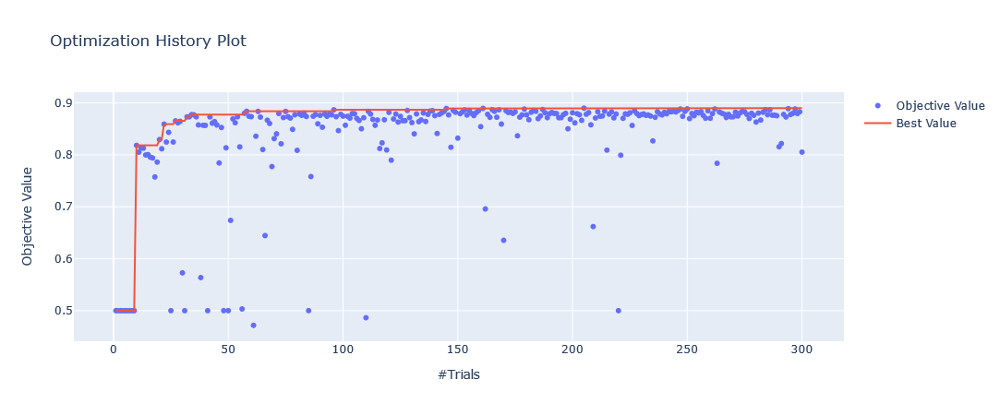

In [26]:
from optuna.visualization import plot_param_importances, plot_optimization_history
plot_optimization_history(study)

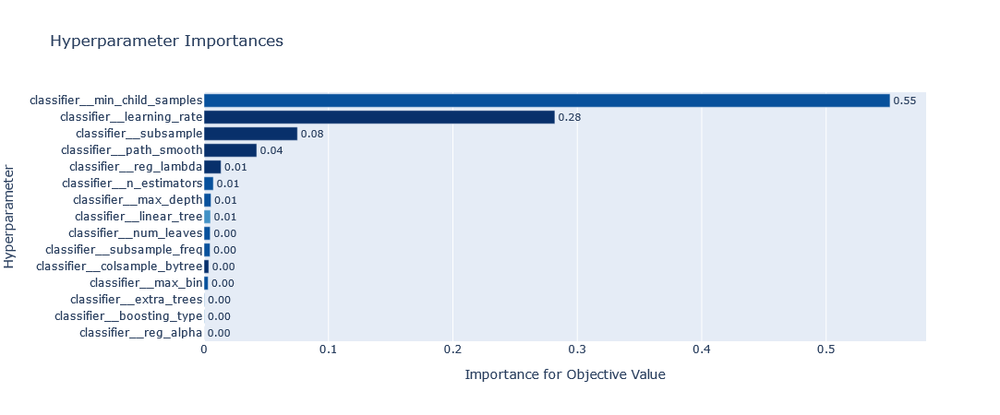

In [27]:
from optuna.visualization import plot_param_importances
plot_param_importances(study)

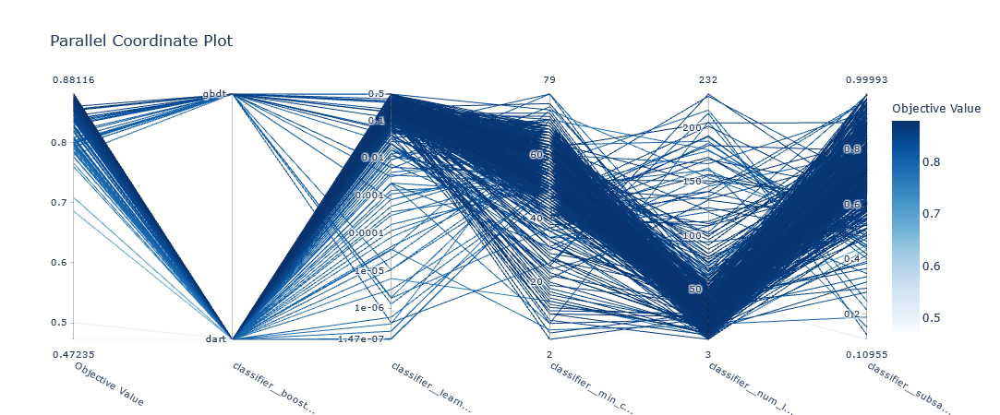

In [65]:
from optuna.visualization import plot_parallel_coordinate
plot_parallel_coordinate(study, params=['classifier__subsample', 'classifier__learning_rate', 'classifier__min_child_samples', 'classifier__num_leaves', 'classifier__boosting_type'])

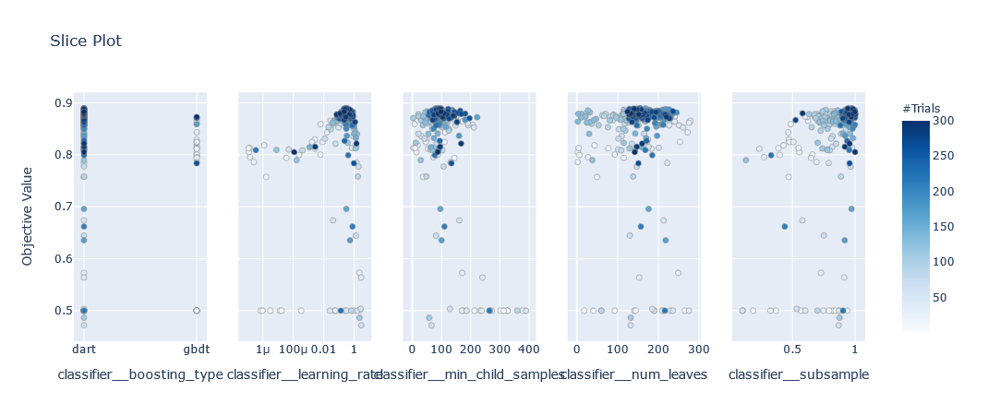

In [28]:
from optuna.visualization import plot_slice
plot_slice(study, params=['classifier__subsample', 'classifier__learning_rate', 'classifier__min_child_samples', 'classifier__num_leaves', 'classifier__boosting_type'])

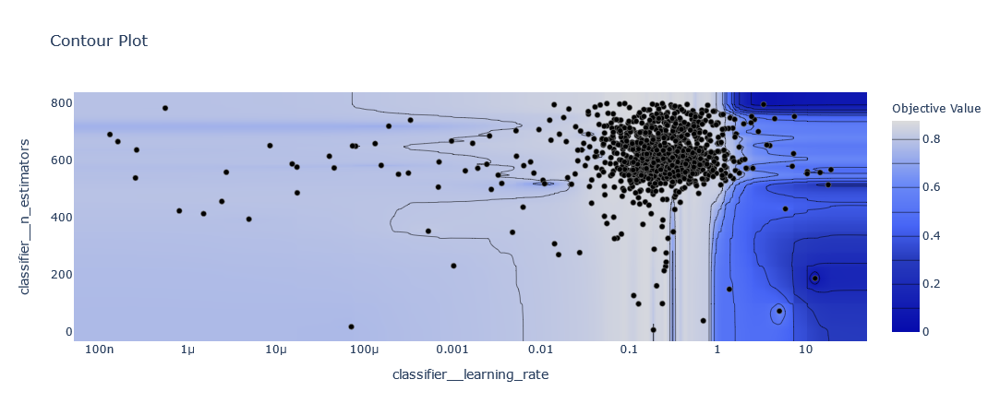

In [46]:
from optuna.visualization import plot_contour
plot_contour(study, params=['classifier__learning_rate', 'classifier__n_estimators'])

In [27]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.pipeline import Pipeline
from scipy.stats.distributions import randint, uniform
from sklearn.utils.fixes import loguniform
from sklearn.feature_selection import SelectFromModel
from sklearn.impute import SimpleImputer
pipeline = Pipeline([
    ('classifier', LGBMRegressor())
])
search = TuneSearchCV(pipeline, sklearn_to_optuna({
    'classifier__n_estimators': randint(10, 600),
    'classifier__boosting_type': ['dart', 'gbdt'],
    'classifier__num_leaves': randint(3, 233),
    'classifier__reg_alpha': loguniform(1e-9, 1e2),
    'classifier__reg_lambda': loguniform(1e-9, 1e3),
    'classifier__learning_rate': loguniform(1e-7, 5e-1),
    'classifier__subsample': uniform(0.1, 0.9),
    'classifier__subsample_freq': randint(0, 12),
    'classifier__min_child_samples': randint(2, 80),
    'classifier__max_depth': randint(1, 30),
    'classifier__max_bin': [31, 63, 127, 255, 300],
    'classifier__extra_trees': [False, True],
#     'classifier__path_smooth': [0, 0.00001, 0.001, 0.005, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 5.0, 10.0, 20.0, 50.0, 100.0], 
    'classifier__path_smooth': loguniform(1e-12, 100), 
    'classifier__colsample_bytree': uniform(0.1, 0.9), 
    'classifier__linear_tree': [False, True]
}), n_jobs=-1, cv=7, n_trials=20, verbose=1, early_stopping=True, search_optimization='optuna', scoring=make_scorer(thresh_accuracy))

c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\tune_sklearn\tune_basesearch.py:429: UserWarning: early_stopping is enabled but max_iters = 1. To enable partial training, set max_iters > 1.
  category=UserWarning)
c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\tune_sklearn\tune_basesearch.py:446: UserWarning: tune-sklearn implements incremental learning for lightgbm models following this: https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMModel.html#lightgbm.LGBMModel.fit This may negatively impact performance. To disable, set `early_stopping=False`.
  category=UserWarning)


In [28]:
search.fit(train.loc[:, train.columns.str.contains('embedding')], train['y'])

[I 2021-04-11 11:46:17,572] A new study created in memory with name: optuna


TypeError: cannot unpack non-iterable IntUniformDistribution object

In [36]:
search.best_params

{'classifier__boosting_type': 'gbdt',
 'classifier__colsample_bytree': 0.39885020853105413,
 'classifier__extra_trees': True,
 'classifier__learning_rate': 0.015174362147821354,
 'classifier__linear_tree': True,
 'classifier__max_bin': 63,
 'classifier__max_depth': 11,
 'classifier__min_child_samples': 64,
 'classifier__n_estimators': 353,
 'classifier__num_leaves': 173,
 'classifier__path_smooth': 1.637719978500742e-11,
 'classifier__reg_alpha': 4.602904633633518e-06,
 'classifier__reg_lambda': 7.428663955688437e-08,
 'classifier__subsample': 0.3708524970372751,
 'classifier__subsample_freq': 7}

In [37]:
thresh_accuracy(test['y'], search.predict(test.loc[:, test.columns.str.contains('embedding')]))

0.8255282695602513

In [331]:
reg = search.best_estimator

In [38]:
cross_validate(reg, embedding_full.loc[:, embedding_full.columns.str.contains('embedding')], embedding_full['y'], scoring=make_scorer(thresh_accuracy), cv=RepeatedStratifiedKFold(n_splits=5, n_repeats=5))['test_score'].mean()

0.8358239141527959

In [54]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.pipeline import Pipeline
from scipy.stats.distributions import randint, uniform
from sklearn.utils.fixes import loguniform
from sklearn.feature_selection import SelectFromModel
from sklearn.impute import SimpleImputer
pipeline = Pipeline([
    ('classifier', LGBMRegressor())
])
search = RandomizedSearchCV(pipeline, {
    'classifier__n_estimators': randint(10, 600),
    'classifier__boosting_type': ['dart', 'gbdt'],
    'classifier__num_leaves': randint(3, 233),
    'classifier__reg_alpha': loguniform(1e-9, 1e2),
    'classifier__reg_lambda': loguniform(1e-9, 1e3),
    'classifier__learning_rate': loguniform(1e-7, 5e-1),
    'classifier__subsample': uniform(0.1, 0.9),
    'classifier__subsample_freq': randint(0, 12),
    'classifier__min_child_samples': randint(2, 80),
    'classifier__max_depth': randint(1, 30),
    'classifier__max_bin': [31, 63, 127, 255, 300],
    'classifier__extra_trees': [False, True],
    'classifier__path_smooth': [0, 0.00001, 0.001, 0.005, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 5.0, 10.0], 
    'classifier__colsample_bytree': uniform(0.1, 0.9), 
    'classifier__linear_tree': [False, True]
}, n_jobs=-1, cv=7, n_iter=40, scoring=make_scorer(thresh_accuracy))

In [55]:
search.fit(train.loc[:, train.columns.str.contains('embedding')], train['y'])

RandomizedSearchCV(cv=7,
                   estimator=Pipeline(steps=[('classifier', LGBMRegressor())]),
                   n_iter=40, n_jobs=-1,
                   param_distributions={'classifier__boosting_type': ['dart',
                                                                      'gbdt'],
                                        'classifier__colsample_bytree': <scipy.stats._distn_infrastructure.rv_frozen object at 0x00000268010E42C8>,
                                        'classifier__extra_trees': [False,
                                                                    True],
                                        'classifier__learning_rate': <scipy.stats...
                                        'classifier__reg_alpha': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000026840CEE9C8>,
                                        'classifier__reg_lambda': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000026800695488>,
                               

In [56]:
thresh_accuracy(test['y'], search.predict(test.loc[:, test.columns.str.contains('embedding')]))

0.8151515151515151

In [68]:
search.best_estimator_.steps[0][1]

LGBMRegressor(boosting_type='dart', colsample_bytree=0.35469716539134244,
              extra_trees=False, learning_rate=0.07919935467870608,
              linear_tree=True, max_bin=300, max_depth=14, min_child_samples=35,
              n_estimators=445, num_leaves=14, path_smooth=1.0,
              reg_alpha=0.0011483511903893674, reg_lambda=39.76329623436349,
              subsample=0.826701165697478, subsample_freq=10)

In [30]:
# reg = LGBMRegressor(boosting_type='dart', colsample_bytree=0.35469716539134244,
#               extra_trees=False, learning_rate=0.07919935467870608,
#               linear_tree=False, max_bin=300, max_depth=14, min_child_samples=35,
#               n_estimators=445, num_leaves=14, path_smooth=1.0,
#               reg_alpha=0.0011483511903893674, reg_lambda=39.76329623436349,
#               subsample=0.826701165697478, subsample_freq=10, n_jobs=-1)
reg = LGBMRegressor(**{k.split('__')[1]: v for k, v in {'classifier__n_estimators': 530,
 'classifier__boosting_type': 'dart',
 'classifier__num_leaves': 156,
 'classifier__reg_alpha': 0.00028224031924403226,
 'classifier__reg_lambda': 1.850255961817264,
 'classifier__learning_rate': 0.2702586832147005,
 'classifier__subsample': 0.9458887721921838,
 'classifier__subsample_freq': 7,
 'classifier__min_child_samples': 87,
 'classifier__max_depth': 6,
 'classifier__max_bin': 474,
 'classifier__extra_trees': False,
 'classifier__path_smooth': 1.4588886728587087e-08,
 'classifier__colsample_bytree': 0.24110522002787785,
 'classifier__linear_tree': False}.items()})
reg.fit(train.loc[:, train.columns.str.contains('embedding')], train['y'])

LGBMRegressor(boosting_type='dart', colsample_bytree=0.24110522002787785,
              extra_trees=False, learning_rate=0.2702586832147005,
              linear_tree=False, max_bin=474, max_depth=6, min_child_samples=87,
              n_estimators=530, num_leaves=156,
              path_smooth=1.4588886728587087e-08,
              reg_alpha=0.00028224031924403226, reg_lambda=1.850255961817264,
              subsample=0.9458887721921838, subsample_freq=7)

In [118]:
train.loc[:, train.columns.str.startswith('embedding')]

,embedding_0 0 amax 0,embedding_0 0 amax 1,embedding_0 0 amax 10,embedding_0 0 amax 11,embedding_0 0 amax 12,embedding_0 0 amax 13,embedding_0 0 amax 14,embedding_0 0 amax 15,embedding_0 0 amax 16,embedding_0 0 amax 17,...,embedding_31 2 median 22,embedding_31 2 median 23,embedding_31 2 median 24,embedding_31 2 median 3,embedding_31 2 median 4,embedding_31 2 median 5,embedding_31 2 median 6,embedding_31 2 median 7,embedding_31 2 median 8,embedding_31 2 median 9
210,0.661338,0.849485,-0.115995,-0.016258,0.370843,0.279045,0.181805,0.040787,0.560936,0.427521,...,0.858761,1.083058,0.786626,0.661700,0.640521,0.510959,0.408346,0.583107,1.066567,1.027623
709,0.807625,0.797932,0.029078,-0.051929,0.041319,-0.039127,0.105533,0.071893,-0.052534,-0.035992,...,2.037468,1.812652,1.787966,1.000024,1.474799,1.397874,1.584386,1.193157,1.241279,1.628198
56,0.297742,0.302426,-0.015783,0.031773,-0.037827,0.032099,0.156523,-0.075328,-0.274746,-0.106563,...,1.173735,1.168051,1.111312,1.306704,1.013316,1.149160,1.459255,1.760217,1.181540,1.274473
15,-0.004980,0.072776,-0.135899,-0.089147,-0.076805,-0.172750,-0.089368,-0.029456,0.212859,0.306355,...,1.151120,1.101533,0.868927,1.257707,1.138526,0.920421,0.997765,0.965689,0.561592,0.911522
544,-0.003260,0.010797,0.205201,0.130189,0.154337,0.303403,0.629477,0.378468,0.108175,0.194878,...,0.734950,1.191734,0.898700,0.817957,0.342910,0.208606,0.180262,0.417390,0.749372,0.743068
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623,0.768912,0.673878,0.484393,0.539878,0.367893,0.553531,0.305582,0.372581,0.304092,0.208750,...,0.951791,1.193779,0.758274,0.576371,0.374732,0.230885,0.375419,0.332813,0.252071,0.878247
405,0.390173,0.327816,-0.101036,0.057691,-0.013622,0.045412,-0.014458,0.113113,0.058853,-0.100259,...,0.808263,0.905588,0.870523,0.987419,0.597371,0.497561,0.615383,0.684433,0.578464,0.972418
367,0.294515,0.004504,0.320538,0.088174,0.119810,0.061147,0.154178,0.025012,0.065291,0.058659,...,0.217279,0.537550,0.365811,0.194646,-0.063306,-0.036826,-0.073048,-0.397914,-0.481315,-0.201846
358,0.025962,0.088133,0.305610,0.456974,0.571027,0.905100,0.470736,-0.130638,0.287832,-0.020745,...,0.703498,0.728286,0.956818,0.411609,-0.063047,0.231924,0.336888,0.331719,0.407829,0.609797


In [31]:
import shap
explainer = shap.Explainer(reg)
shaps = explainer(train.loc[:, train.columns.str.contains('embedding')])

In [32]:
df_shaps = pd.DataFrame(np.abs(shaps.values).T)

In [33]:
df_shaps.index = train.columns[train.columns.str.contains('embedding')]

In [34]:
df_shaps.columns = 'shap_' + df_shaps.columns.astype(str)
df_shaps

,shap_0,shap_1,shap_2,shap_3,shap_4,shap_5,shap_6,shap_7,shap_8,shap_9,...,shap_654,shap_655,shap_656,shap_657,shap_658,shap_659,shap_660,shap_661,shap_662,shap_663
embedding_0 0 amax 0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
embedding_0 0 amax 1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
embedding_0 0 amax 10,0.000437,0.000942,0.000623,0.000630,0.000942,0.002261,0.000361,0.001663,0.001663,0.000942,...,0.000630,0.000630,0.001049,0.001049,0.001663,0.001049,0.001663,0.000942,0.001663,0.002261
embedding_0 0 amax 11,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
embedding_0 0 amax 12,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
embedding_31 2 median 5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
embedding_31 2 median 6,0.002003,0.005561,0.002003,0.005561,0.005561,0.005561,0.005561,0.005561,0.002094,0.005561,...,0.005561,0.002003,0.005561,0.005561,0.005561,0.002094,0.002094,0.001170,0.005561,0.001170
embedding_31 2 median 7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
embedding_31 2 median 8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [35]:
df_shaps.index.str.extract('embedding_\d\d? \d ([a-z]*) \d\d?').iloc[:, 0]

0         amax
1         amax
2         amax
3         amax
4         amax
         ...  
9595    median
9596    median
9597    median
9598    median
9599    median
Name: 0, Length: 9600, dtype: object

In [36]:
df_shaps['feat'] = df_shaps.index.str.extract('embedding_(\d\d?) \d [a-z]* \d\d?').iloc[:, 0].values
df_shaps['axis'] = df_shaps.index.str.extract('embedding_\d\d? (\d) [a-z]* \d\d?').iloc[:, 0].values
df_shaps['agg'] = df_shaps.index.str.extract('embedding_\d\d? \d ([a-z]*) \d\d?').iloc[:, 0].values
df_shaps['slab_index'] = df_shaps.index.str.extract('embedding_\d\d? \d [a-z]* (\d\d?)').iloc[:, 0].values

In [37]:
df_shaps_long = pd.wide_to_long(df_shaps, ['shap'], sep='_', i=['feat', 'axis', 'agg', 'slab_index'], j='sample').reset_index()

In [38]:
df_shaps_long

,feat,axis,agg,slab_index,sample,shap
0,0,0,amax,0,0,0.0
1,0,0,amax,0,1,0.0
2,0,0,amax,0,2,0.0
3,0,0,amax,0,3,0.0
4,0,0,amax,0,4,0.0
...,...,...,...,...,...,...
6374395,31,2,median,9,659,0.0
6374396,31,2,median,9,660,0.0
6374397,31,2,median,9,661,0.0
6374398,31,2,median,9,662,0.0


In [45]:
df_shaps_long.feat = pd.to_numeric(df_shaps_long.feat)
df_shaps_long.axis = pd.to_numeric(df_shaps_long.axis)
df_shaps_long.slab_index = pd.to_numeric(df_shaps_long.slab_index)

<AxesSubplot:xlabel='agg', ylabel='shap'>

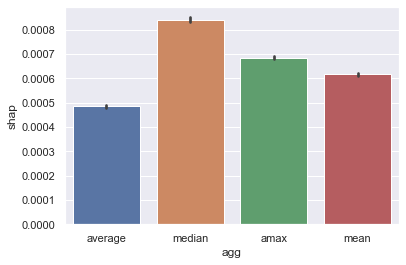

In [109]:
import seaborn as sns
sns.barplot(data=df_shaps_long.sample(frac=0.5), x='agg', y='shap')

<AxesSubplot:xlabel='axis', ylabel='shap'>

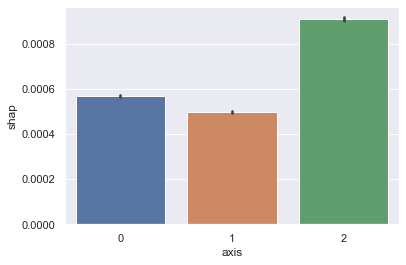

In [110]:
sns.barplot(data=df_shaps_long.sample(frac=0.5), x='axis', y='shap')

<AxesSubplot:xlabel='feat', ylabel='shap'>

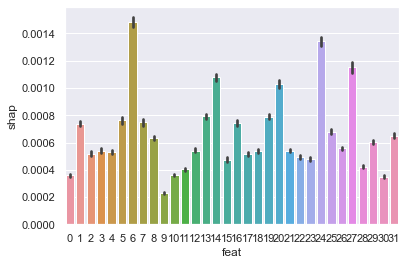

In [111]:
sns.barplot(data=df_shaps_long.sample(frac=0.5), x='feat', y='shap')

<AxesSubplot:xlabel='slab_index', ylabel='shap'>

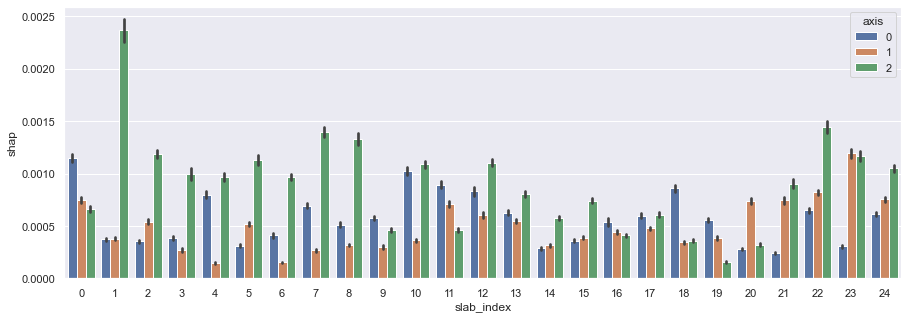

In [112]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 5))
sns.barplot(data=df_shaps_long.sample(frac=0.5), x='slab_index', y='shap', hue='axis')

In [75]:
import SimpleITK as sitk
import os
import numpy as np
from tqdm import tqdm
def read_image(path: str):
    # Reads the image using SimpleITK
    itkimage = sitk.ReadImage(path)

    # Convert the image to a  numpy array first and then shuffle the dimensions to get axis in the order z,y,x
    return sitk.GetArrayFromImage(itkimage)
img_files = list(os.scandir(r'C:\Users\Roel\Documents\scan_cropped4'))
img = read_image(img_files[0].path)

In [78]:
g.axes.shape

(4, 3)

In [92]:
import re
re.findall(r'agg = (\w+)', str(a.title))[0]

'median'

In [104]:
crop_slices = tuple(slice(int(s*0.125), int(s*(1-0.125))) for s in img.shape)

In [106]:
img[crop_slices].shape

(213, 156, 234)

Using the barplot function without specifying `order` is likely to produce an incorrect plot.


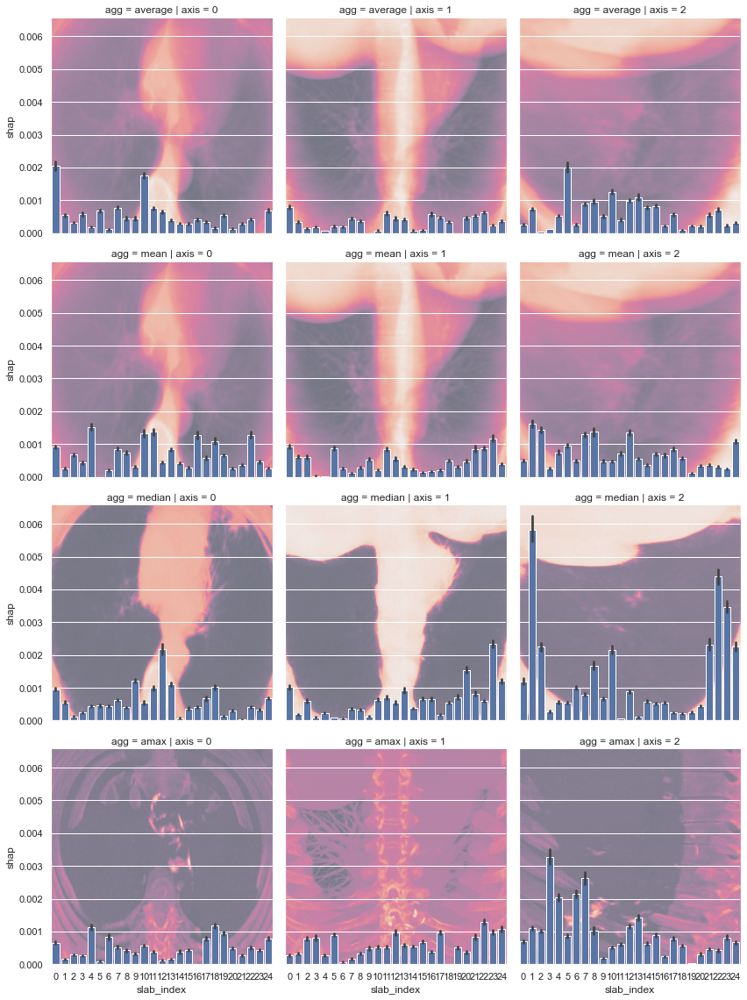

In [107]:
g = sns.FacetGrid(df_shaps_long.sample(frac=0.5), row="agg", col='axis', height=4)

agg_funcs = {
    'median': np.median, 
    'amax': np.max, 
    'mean': np.mean, 
    'average': np.mean
}

g.map(sns.barplot, 'slab_index', 'shap')
for axis in [0, 1, 2]:
    for j in range(4):
        a = g.axes[j, axis]
        agg_func_name = re.findall(r'agg = (\w+)', str(a.title))[0]
        agg_func = agg_funcs[agg_func_name]
        a.imshow(agg_func(img[crop_slices], axis=axis), aspect='auto', extent=(a.get_xlim()[0], a.get_xlim()[1], a.get_ylim()[0], a.get_ylim()[1]), alpha=0.5)

In [115]:
thresh_accuracy(test['y'], reg.predict(test.loc[:, test.columns.str.contains('embedding')]))

0.8656756756756757

In [119]:
study.best_value

0.8899095857184136

In [66]:
a = g.axes[0, 0]
a.imshow(np.zeros((32, 32)))

([<matplotlib.axis.XTick at 0x26887707a48>,
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9')])

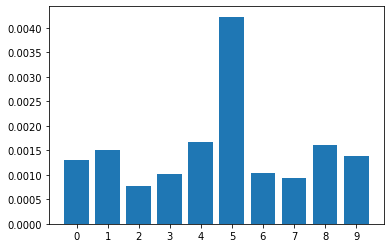

In [154]:
import matplotlib.pyplot as plt
plt.bar(np.arange(10), df_shaps.groupby('slab_index').mean().mean(axis=1))
plt.xticks(labels=df_shaps.groupby('slab_index').mean().mean(axis=1).index, ticks=np.arange(10))

In [107]:
for g in df_shaps.groupby(df_shaps.columns.str.extract('embedding_\d\d? \d ([a-z]*) \d\d?').values, axis=1):
    print(g)

ValueError: Buffer has wrong number of dimensions (expected 1, got 2)

In [43]:
!pip install flaml

  Using cached xgboost-1.3.3-py3-none-win_amd64.whl (95.2 MB)
  Using cached graphviz-0.16-py2.py3-none-any.whl (19 kB)
  Using cached plotly-4.14.3-py2.py3-none-any.whl (13.2 MB)
  Using cached retrying-1.3.3-py3-none-any.whl


In [212]:
def thresh_accuracy_flaml(X_test, y_test, estimator, labels,
             X_train, y_train, weight_test=None, weight_train=None):
    y_pred = estimator.predict(X_test)
    y_thresh = np.round(y_test/5)
    y_pred_thresh = y_pred/5
    return -roc_auc_score(y_t   hresh, y_pred_thresh), []

In [213]:
from flaml import AutoML
automl = AutoML()

In [214]:
automl.fit(train.loc[:, train.columns.str.contains('embedding')], train['y'], task="regression", metric=thresh_accuracy_flaml, eval_method='cv', n_splits=9, time_budget=60*60, ensemble=True)

[flaml.automl: 04-09 21:46:08] {890} INFO - Evaluation method: cv
[flaml.automl: 04-09 21:46:08] {606} INFO - Using RepeatedKFold
[flaml.automl: 04-09 21:46:08] {911} INFO - Minimizing error metric: customized metric
[flaml.automl: 04-09 21:46:08] {930} INFO - List of ML learners in AutoML Run: ['lgbm', 'rf', 'catboost', 'xgboost', 'extra_tree']
[flaml.automl: 04-09 21:46:08] {994} INFO - iteration 0, current learner lgbm
[flaml.automl: 04-09 21:46:16] {1147} INFO -  at 10.2s,	best lgbm's error=-0.7698,	best lgbm's error=-0.7698
[flaml.automl: 04-09 21:46:16] {994} INFO - iteration 1, current learner lgbm
[flaml.automl: 04-09 21:46:22] {1147} INFO -  at 15.6s,	best lgbm's error=-0.7698,	best lgbm's error=-0.7698
[flaml.automl: 04-09 21:46:22] {994} INFO - iteration 2, current learner lgbm
[flaml.automl: 04-09 21:46:28] {1147} INFO -  at 22.1s,	best lgbm's error=-0.7698,	best lgbm's error=-0.7698
[flaml.automl: 04-09 21:46:28] {994} INFO - iteration 3, current learner lgbm
[flaml.automl

In [338]:
automl.model

StackingRegressor(estimators=[('lgbm',
                               <flaml.model.LGBMEstimator object at 0x00000268C8DB4EC8>),
                              ('catboost',
                               <flaml.model.CatBoostEstimator object at 0x00000268C951BAC8>)],
                  final_estimator=<flaml.model.LGBMEstimator object at 0x00000268C8DB4EC8>,
                  n_jobs=-1, passthrough=True)

In [228]:
reg = LGBMRegressor(n_jobs=-1, **{'n_estimators': 489,
 'num_leaves': 4,
 'min_child_samples': 67,
 'learning_rate': 0.16979178802981557,
 'subsample': 0.8608384603339592,
 'log_max_bin': 5,
 'colsample_bytree': 0.750840801162797,
 'reg_alpha': 0.0009765625,
 'reg_lambda': 1.1607821515251706, 'boosting_type': 'dart', 'linear_tree': True})
reg.fit(train.loc[:, train.columns.str.contains('embedding')], train['y'])

LGBMRegressor(boosting_type='dart', colsample_bytree=0.750840801162797,
              learning_rate=0.16979178802981557, linear_tree=True,
              log_max_bin=5, min_child_samples=67, n_estimators=489,
              num_leaves=4, reg_alpha=0.0009765625,
              reg_lambda=1.1607821515251706, subsample=0.8608384603339592)

In [339]:
cross_validate(automl.model, embedding_full.loc[:, embedding_full.columns.str.contains('embedding')], embedding_full['y'], scoring=make_scorer(thresh_accuracy), cv=RepeatedStratifiedKFold(n_splits=5, n_repeats=3))['test_score'].mean()

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\joblib\externals\loky\process_executor.py", line 431, in _process_worker
    r = call_item()
  File "c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\joblib\externals\loky\process_executor.py", line 285, in __call__
    return self.fn(*self.args, **self.kwargs)
  File "c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\joblib\_parallel_backends.py", line 595, in __call__
    return self.func(*args, **kwargs)
  File "c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\joblib\parallel.py", line 263, in __call__
    for func, args, kwargs in self.items]
  File "c:\users\roel\.virtualenvs\diagcovid-ckc2berq\lib\site-packages\joblib\parallel.py", line 263, in <listcomp>
    f

nan

In [224]:
thresh_accuracy(test['y'], reg.predict(test.loc[:, test.columns.str.contains('embedding')]))

0.9427942794279428

In [242]:
!pip install --upgrade lightgbm

In [111]:
df = pd.read_pickle('../data/processed/rumc.pkl')

In [112]:
df.columns[df.columns.str.contains('Glucose')]

Index(['Glucose', 'Glucose (Liquor)', 'Glucose (POCT)', 'Glucose (bloedgas)',
       'Glucose (overig)', 'Glucose (urine)', 'Glucose T1',
       'Glucose T1 (Bloedgas)', 'Glucose T2', 'Glucose T3', 'Glucose T4',
       'Glucose kwal. (Urine)', 'Glucose ratio liquor/bloed'],
      dtype='object')

In [113]:
df_rumc = pd.read_csv('../data/raw/covid_ct_CF_anon_with_date_shifts.csv', index_col=0)


In [118]:
df_rumc[df_rumc.labresultsvalue.str.contains('Normaal', na=False)].labresultsname

31366           Bilirubine (Liquor)
31367     Vrij hemoglobine (liquor)
34354           Bilirubine (Liquor)
34355     Vrij hemoglobine (liquor)
61364           Bilirubine (Liquor)
61365     Vrij hemoglobine (liquor)
104473          Bilirubine (Liquor)
104474    Vrij hemoglobine (liquor)
108113          Bilirubine (Liquor)
108114    Vrij hemoglobine (liquor)
143112          Bilirubine (Liquor)
143113          Bilirubine (Liquor)
143114    Vrij hemoglobine (liquor)
143115    Vrij hemoglobine (liquor)
153746          Bilirubine (Liquor)
153747    Vrij hemoglobine (liquor)
178769     Granulocyten functietest
212461          Bilirubine (Liquor)
212462    Vrij hemoglobine (liquor)
239290          Bilirubine (Liquor)
239291    Vrij hemoglobine (liquor)
Name: labresultsname, dtype: object

In [ ]:
labresultsvalue